<div class='alert alert-info'>
PERGUNTAS DE NEGÓCIOS COM A RESOLUÇÃO DA ANÁLISE E PREDIÇÃO DO MODELO.

--> RESPOSTAS NO FINAL DO PROJETO
</div>

1) Segmento da população: a qual segmento da população a campanha de marketing será direcionada e por quê? Este aspecto da campanha de marketing é extremamente importante, pois dirá a qual parte da população provavelmente receberá a mensagem da campanha de marketing.

2) Canal de distribuição para atingir o local do cliente: implementar a estratégia mais eficaz para obter o máximo desta campanha de marketing. Qual segmento da população devemos abordar? Qual instrumento devemos usar para divulgar nossa mensagem? (Ex: telefones, rádio, TV, mídia social etc.)

3) Preço: qual é o melhor preço a ser oferecido a clientes em potencial? (No caso da campanha de marketing do banco, isso não é necessário, pois o principal interesse do banco é que os clientes em potencial abram contas de depósito para que as atividades operacionais do banco continuem funcionando.)

4) Estratégia promocional: esta é a maneira como a estratégia será implementada e como os clientes em potencial serão abordados. Esta deve ser a última parte da análise da campanha de marketing, pois é preciso haver uma análise aprofundada das campanhas anteriores (se possível) para aprender com os erros anteriores e determinar como tornar a campanha de marketing muito mais eficaz.

In [60]:
import pandas as pd
from scipy import stats
import numpy as np
import random
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.express as px
import warnings
warnings.simplefilter("ignore")
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, ShuffleSplit
from sklearn.metrics import accuracy_score, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from xgboost.sklearn import XGBClassifier
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import (r2_score, ConfusionMatrixDisplay, classification_report, 
precision_recall_curve, roc_curve, confusion_matrix, RocCurveDisplay)
from sklearn.impute import KNNImputer
from imblearn import under_sampling, over_sampling
from imblearn.over_sampling import SMOTE

In [61]:
# def create_connection():
#     conn = mysql.connector.connect(
#         host='localhost',
#         user='',
#         password='',
#         database='')
#     return conn

<div class='alert alert-info'>
    Aqui defino funções de redimensionamento de gráficos e e remoção de Outliers.
</div>

In [62]:
def resizeplot(x,y,d):
    plt.figure(figsize=(x,y),dpi=d)

def removeout(df,ft):
    Q1 = df[ft].quantile(0.25)
    Q3 = df[ft].quantile(0.75)
    iqr = Q3-Q1
    trh=1.5
    outl = df[(df[ft]<Q1 - trh * iqr) | (df[ft]>Q3 + trh*iqr)]
    df[ft] = df[ft].drop(outl.index)

In [63]:
df= pd.read_csv('csv/bank-additional-full.csv', sep=';')

In [64]:
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [65]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

In [66]:
df.describe()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
count,41188.00000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000
mean,40.02406,258.285010,2.567593,962.475454,0.172963,0.081886,93.575664,-40.502600,3.621291,5167.035911
std,10.42125,259.279249,2.770014,186.910907,0.494901,1.570960,0.578840,4.628198,1.734447,72.251528
min,17.00000,0.000000,1.000000,0.000000,0.000000,-3.400000,92.201000,-50.800000,0.634000,4963.600000
25%,32.00000,102.000000,1.000000,999.000000,0.000000,-1.800000,93.075000,-42.700000,1.344000,5099.100000
50%,38.00000,180.000000,2.000000,999.000000,0.000000,1.100000,93.749000,-41.800000,4.857000,5191.000000
75%,47.00000,319.000000,3.000000,999.000000,0.000000,1.400000,93.994000,-36.400000,4.961000,5228.100000
max,98.00000,4918.000000,56.000000,999.000000,7.000000,1.400000,94.767000,-26.900000,5.045000,5228.100000


<Axes: xlabel='duration', ylabel='Count'>

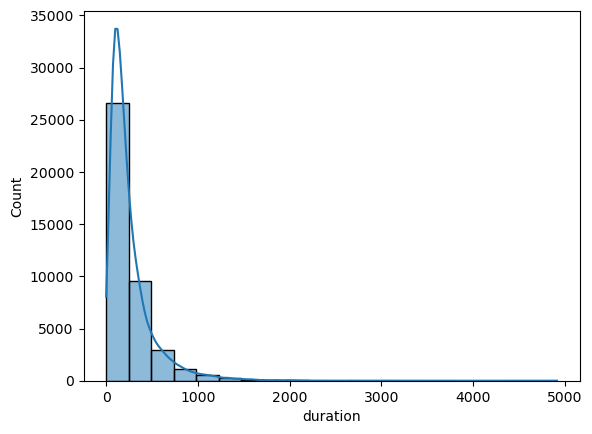

In [67]:
sns.histplot(df,x='duration', bins=20, kde=True)

In [68]:
#new_df[(new_df['duration']>600)&(new_df['duration']<=1000)&(new_df['age']>50)]

In [69]:
# def outliers(df, ft):
#     Q1 = df[ft].quantile(0.25)
#     Q3 = df[ft].quantile(0.75)
#     iqr = Q3-Q1

#     lower_bound  = Q1 - 1.5 *iqr
#     upper_bound = Q3 + 1.5 *iqr

#     ls = df.index[(df[ft]<lower_bound) | (df[ft]>upper_bound)]
#     return ls
    

In [70]:
#outliers(df,'duration')

In [71]:
# index_list=[]
# for i in ['duration']:
#     index_list.append(outliers(df,i))

In [72]:
# upper_limit = df['duration'].quantile(0.99)
# lower_limit = df['duration'].quantile(0.01)
# print('Upper limit: ', upper_limit)
# print('Lower limit: ', lower_limit)

In [73]:
df.describe()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
count,41188.00000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000
mean,40.02406,258.285010,2.567593,962.475454,0.172963,0.081886,93.575664,-40.502600,3.621291,5167.035911
std,10.42125,259.279249,2.770014,186.910907,0.494901,1.570960,0.578840,4.628198,1.734447,72.251528
min,17.00000,0.000000,1.000000,0.000000,0.000000,-3.400000,92.201000,-50.800000,0.634000,4963.600000
25%,32.00000,102.000000,1.000000,999.000000,0.000000,-1.800000,93.075000,-42.700000,1.344000,5099.100000
50%,38.00000,180.000000,2.000000,999.000000,0.000000,1.100000,93.749000,-41.800000,4.857000,5191.000000
75%,47.00000,319.000000,3.000000,999.000000,0.000000,1.400000,93.994000,-36.400000,4.961000,5228.100000
max,98.00000,4918.000000,56.000000,999.000000,7.000000,1.400000,94.767000,-26.900000,5.045000,5228.100000


<Axes: xlabel='cons.conf.idx'>

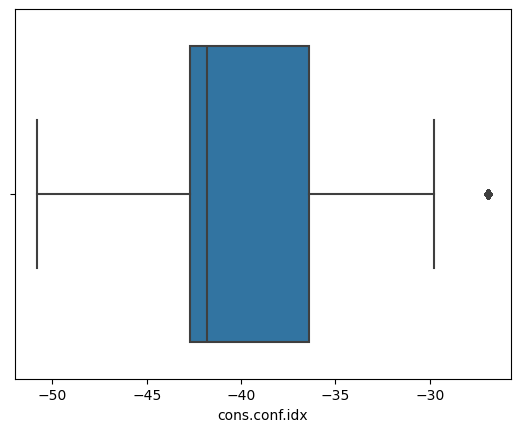

In [74]:
sns.boxplot(df,x='cons.conf.idx')

<div class='alert alert-info'>
Abaixo, removo os Outliers com a função feita anteriormente.
</div>

In [75]:
removeout(df,'cons.conf.idx')

<Axes: xlabel='cons.conf.idx'>

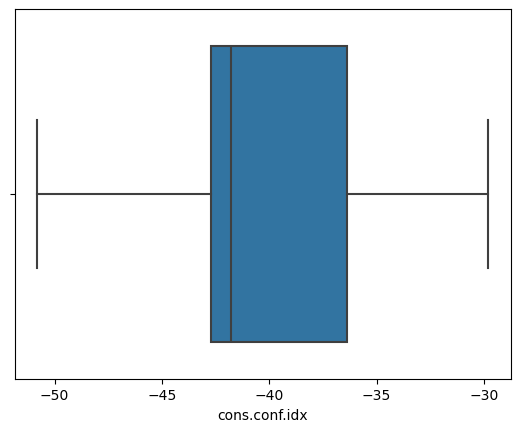

In [76]:
sns.boxplot(df, x='cons.conf.idx')

In [77]:
df[df['cons.conf.idx'].isnull()]

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
38154,50,management,married,university.degree,no,yes,no,cellular,oct,thu,...,2,4,1,success,-3.4,92.431,NaN,0.754,5017.5,yes
38155,37,admin.,single,university.degree,no,yes,no,cellular,oct,thu,...,3,999,0,nonexistent,-3.4,92.431,NaN,0.754,5017.5,yes
38156,59,technician,single,basic.6y,no,no,no,cellular,oct,thu,...,1,999,2,failure,-3.4,92.431,NaN,0.754,5017.5,no
38157,31,admin.,married,university.degree,no,yes,no,cellular,oct,thu,...,1,999,0,nonexistent,-3.4,92.431,NaN,0.754,5017.5,no
38158,35,admin.,married,high.school,no,yes,no,cellular,oct,thu,...,1,4,1,success,-3.4,92.431,NaN,0.754,5017.5,yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38596,69,retired,married,basic.4y,no,yes,yes,cellular,oct,fri,...,3,999,0,nonexistent,-3.4,92.431,NaN,0.720,5017.5,yes
38597,18,student,single,basic.6y,no,no,yes,cellular,oct,fri,...,2,999,0,nonexistent,-3.4,92.431,NaN,0.720,5017.5,yes
38598,59,retired,divorced,basic.4y,no,yes,no,telephone,oct,fri,...,4,999,0,nonexistent,-3.4,92.431,NaN,0.720,5017.5,no
38599,37,admin.,single,university.degree,no,no,no,cellular,oct,fri,...,2,999,0,nonexistent,-3.4,92.431,NaN,0.720,5017.5,yes


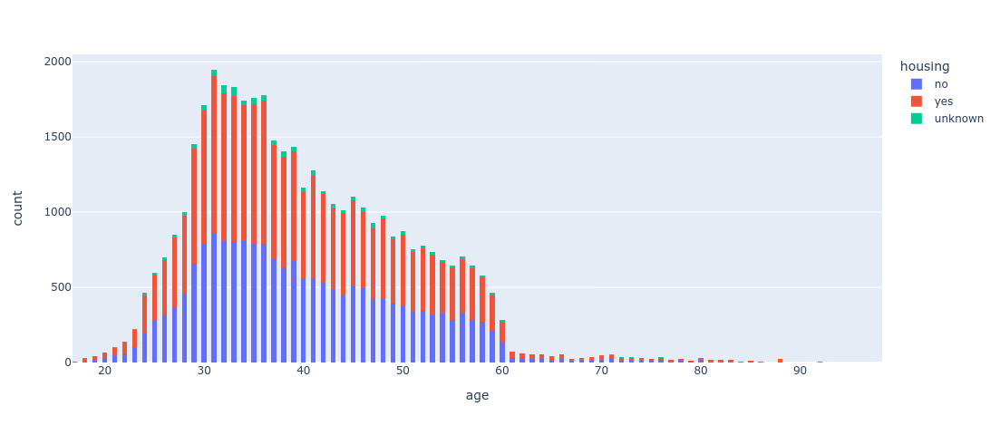

In [78]:
hist1 = px.histogram(df, x='age', color='housing', nbins=180, height=480, width=1100)
hist1.show()

<div class='alert alert-info'>
**Nota**
    
Acima temos uma faixa etária considerável dos 20 aos 60 anos que tem financiamentos habitacionais. Pode ser estiumlada uma campanha para oferta nessa faixa etária para aquisição de novos financiamentos.
</div>

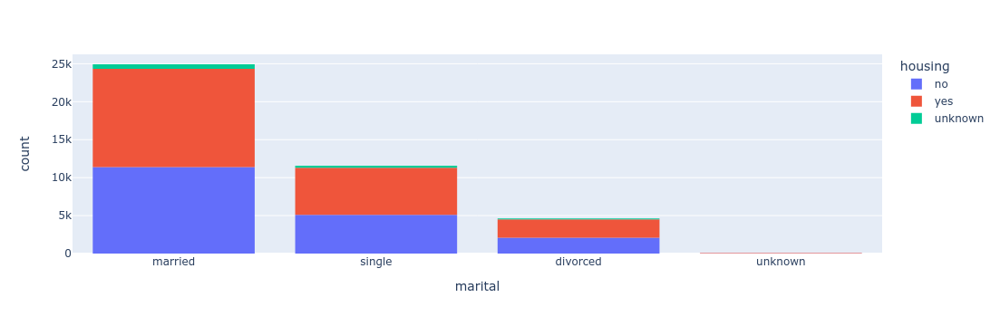

In [79]:
hist1 = px.histogram(df, x='marital', color='housing', nbins=180)
hist1.show()

<div class='alert alert-info'>
---> Indivíduos casados tem uma considerável propensão a adquirir o crédito habitacional seguido das pessoas solteiras o que nos leva a acreditar que estes últimos também podem estar com alguma união conjugal não oficial.
</div>

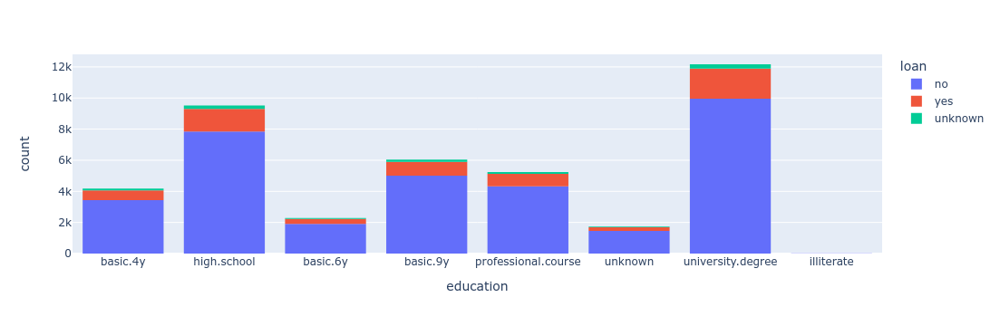

<Figure size 1200x800 with 0 Axes>

In [80]:
resizeplot(12,8,100)
hist1 = px.histogram(df, x='education', color='loan', nbins=180)
hist1.show()

<div class='alert alert-info'>
    Estudantes de faculdade e de ensino médio tem a chance de adquirir crédito para seu custo estudantil.
</div>

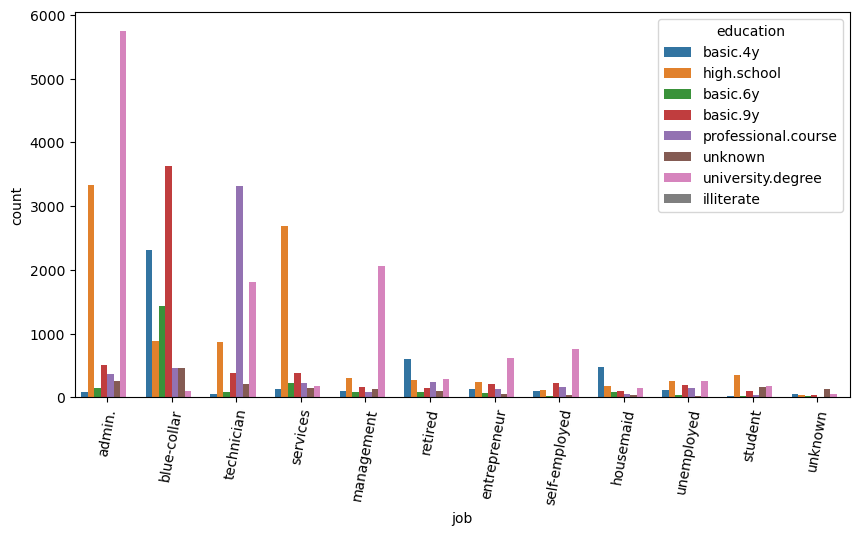

In [81]:
edu = df['job'].value_counts().index
resizeplot(10,5,100)
sns.countplot(df,x='job',hue='education', order=edu)
plt.xticks(rotation=80);

<div class='alert alert-info'>
Abaixo são exibidos as classes profissionais que têm crédito por padrão, ou seja, ninguém.
</div>

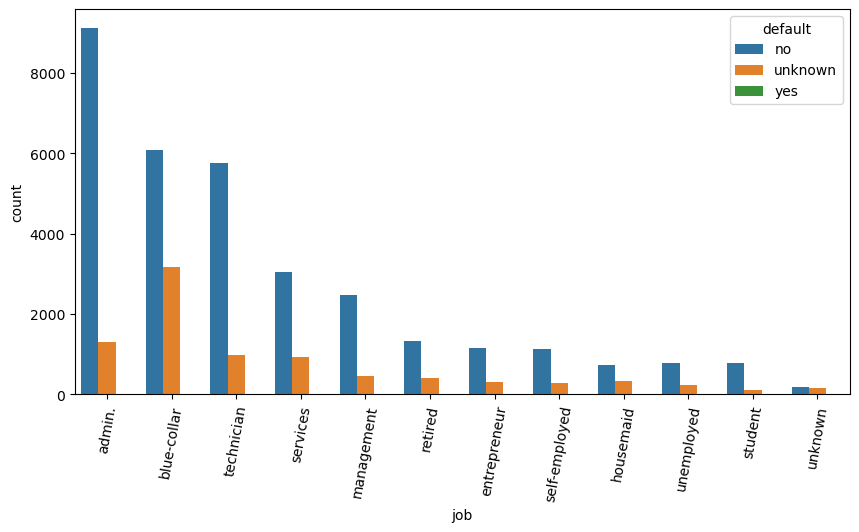

In [82]:
edu = df['job'].value_counts().index
resizeplot(10,5,100)
sns.countplot(df,x='job',hue='default', order=edu)
plt.xticks(rotation=80);

In [83]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   40741 non-null 

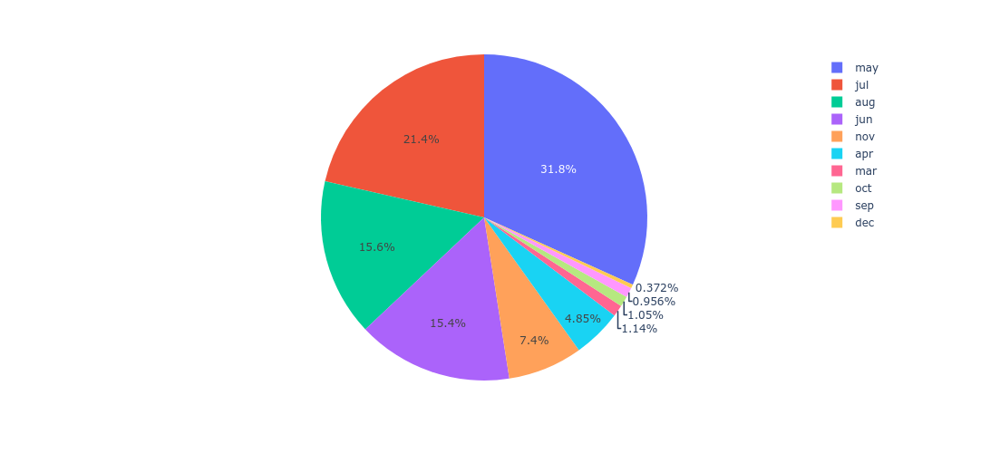

In [84]:
fig_pie = px.pie(df, values='campaign', names='month', height=500)
fig_pie.show()

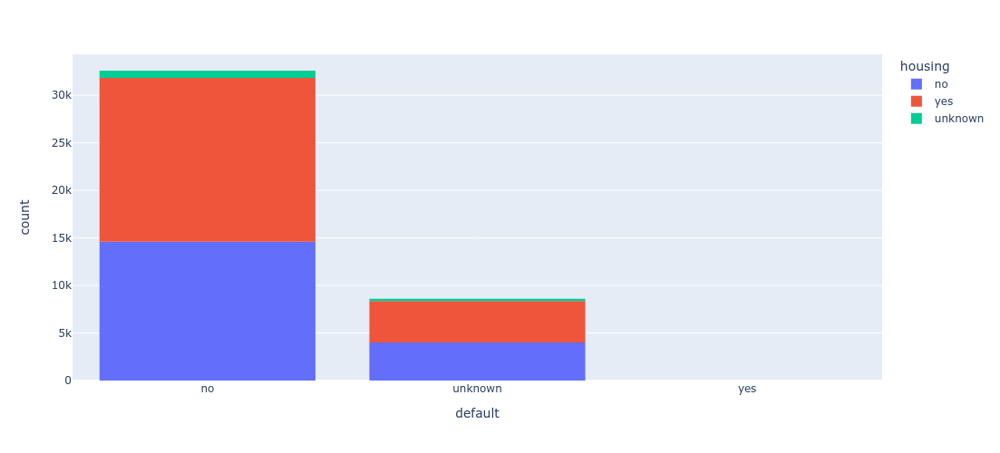

In [85]:
hist2 = px.histogram(df, x='default', color='housing', height=500)
hist2.show()

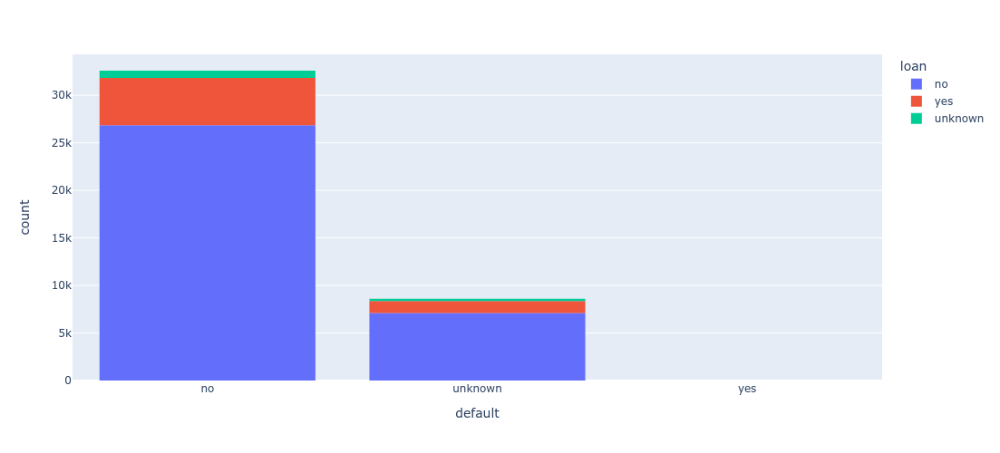

In [86]:
hist2 = px.histogram(df, x='default', color='loan', height=500)
hist2.show()

<div class='alert alert-info'>
FILTRANDO AS PESSOAS QUE NÃO FORAM CONTACTADAS
</div>

In [87]:
df['pdays'].drop(999,axis=0).mean()

962.4745672178115

In [88]:
41187/962.47

42.79302212016998

In [89]:
ncont = df[df['pdays']==999]

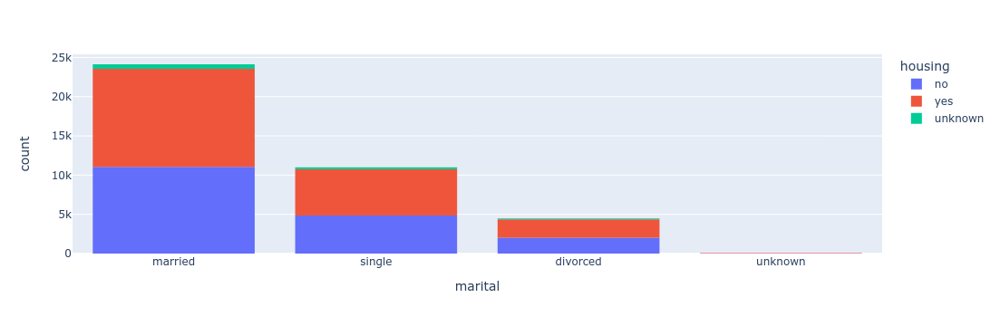

In [90]:
hist3 = px.histogram(ncont, x='marital', color='housing', nbins=180)
hist3.show()

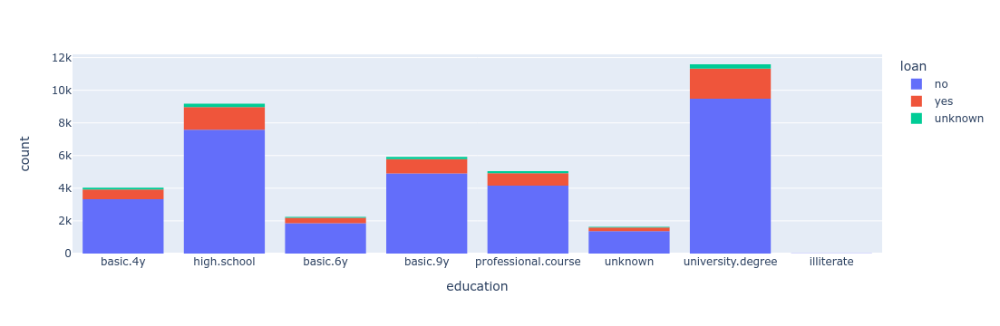

<Figure size 1200x800 with 0 Axes>

In [91]:
resizeplot(12,8,100)
hist4 = px.histogram(ncont, x='education', color='loan', nbins=180)
hist4.show()

<div class='alert alert-success'>
TREINO DOS MODELOS
</div>

In [31]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   40741 non-null 

In [32]:
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [33]:
df.drop('duration', inplace=True,axis=1)

In [34]:
df.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'campaign', 'pdays', 'previous',
       'poutcome', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx',
       'euribor3m', 'nr.employed', 'y'],
      dtype='object')

In [35]:
df = df[['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact','poutcome', 'month', 'day_of_week', 'campaign', 'pdays', 'previous',
       'emp.var.rate', 'cons.price.idx', 'cons.conf.idx',
       'euribor3m', 'nr.employed', 'y']]

In [36]:
df.iloc[:,1:9]

,job,marital,education,default,housing,loan,contact,poutcome
0,housemaid,married,basic.4y,no,no,no,telephone,nonexistent
1,services,married,high.school,unknown,no,no,telephone,nonexistent
2,services,married,high.school,no,yes,no,telephone,nonexistent
3,admin.,married,basic.6y,no,no,no,telephone,nonexistent
4,services,married,high.school,no,no,yes,telephone,nonexistent
...,...,...,...,...,...,...,...,...
41183,retired,married,professional.course,no,yes,no,cellular,nonexistent
41184,blue-collar,married,professional.course,no,no,no,cellular,nonexistent
41185,retired,married,university.degree,no,yes,no,cellular,nonexistent
41186,technician,married,professional.course,no,no,no,cellular,nonexistent


<div class='alert alert-success'>
Aqui implementamos o One Hot Encoder que consiste numa técnica de transformar dados categóricos
em dados numéricos.
</div>

In [37]:
hot = df.iloc[:,1:9]
ohe = OneHotEncoder(handle_unknown='ignore', sparse_output=False).set_output(transform='pandas')
df_ohe = ohe.fit_transform(hot)

In [38]:
df_ohe

,job_admin.,job_blue-collar,job_entrepreneur,job_housemaid,job_management,job_retired,job_self-employed,job_services,job_student,job_technician,...,housing_unknown,housing_yes,loan_no,loan_unknown,loan_yes,contact_cellular,contact_telephone,poutcome_failure,poutcome_nonexistent,poutcome_success
0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
41184,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
41185,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
41186,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [39]:
# new = df[['age','campaign', 'pdays', 'previous','emp.var.rate', 'cons.price.idx', 'cons.conf.idx',
#           'euribor3m', 'nr.employed', 'y']]
df2 = pd.concat([df, df_ohe],axis=1)

In [40]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 58 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   age                            41188 non-null  int64  
 1   job                            41188 non-null  object 
 2   marital                        41188 non-null  object 
 3   education                      41188 non-null  object 
 4   default                        41188 non-null  object 
 5   housing                        41188 non-null  object 
 6   loan                           41188 non-null  object 
 7   contact                        41188 non-null  object 
 8   poutcome                       41188 non-null  object 
 9   month                          41188 non-null  object 
 10  day_of_week                    41188 non-null  object 
 11  campaign                       41188 non-null  int64  
 12  pdays                          41188 non-null 

<div class='alert alert-success'>
Excluimos as colunas que não são mais necessárias.
</div>

In [41]:
df2 = df2.drop(df2.iloc[:,1:11],axis=1)

In [42]:
df2.head()

,age,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y,...,housing_unknown,housing_yes,loan_no,loan_unknown,loan_yes,contact_cellular,contact_telephone,poutcome_failure,poutcome_nonexistent,poutcome_success
0,56,1,999,0,1.1,93.994,-36.4,4.857,5191.0,no,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
1,57,1,999,0,1.1,93.994,-36.4,4.857,5191.0,no,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
2,37,1,999,0,1.1,93.994,-36.4,4.857,5191.0,no,...,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
3,40,1,999,0,1.1,93.994,-36.4,4.857,5191.0,no,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
4,56,1,999,0,1.1,93.994,-36.4,4.857,5191.0,no,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0


<div class='alert alert-success'>
Reorganizamos as colunas.
</div>

In [43]:
df2.columns

Index(['age', 'campaign', 'pdays', 'previous', 'emp.var.rate',
       'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed', 'y',
       'job_admin.', 'job_blue-collar', 'job_entrepreneur', 'job_housemaid',
       'job_management', 'job_retired', 'job_self-employed', 'job_services',
       'job_student', 'job_technician', 'job_unemployed', 'job_unknown',
       'marital_divorced', 'marital_married', 'marital_single',
       'marital_unknown', 'education_basic.4y', 'education_basic.6y',
       'education_basic.9y', 'education_high.school', 'education_illiterate',
       'education_professional.course', 'education_university.degree',
       'education_unknown', 'default_no', 'default_unknown', 'default_yes',
       'housing_no', 'housing_unknown', 'housing_yes', 'loan_no',
       'loan_unknown', 'loan_yes', 'contact_cellular', 'contact_telephone',
       'poutcome_failure', 'poutcome_nonexistent', 'poutcome_success'],
      dtype='object')

In [44]:
df2 = df2[['age', 'campaign', 'pdays', 'previous', 'emp.var.rate',
       'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed', 
       'job_admin.', 'job_blue-collar', 'job_entrepreneur', 'job_housemaid',
       'job_management', 'job_retired', 'job_self-employed', 'job_services',
       'job_student', 'job_technician', 'job_unemployed', 'job_unknown',
       'marital_divorced', 'marital_married', 'marital_single',
       'marital_unknown', 'education_basic.4y', 'education_basic.6y',
       'education_basic.9y', 'education_high.school', 'education_illiterate',
       'education_professional.course', 'education_university.degree',
       'education_unknown', 'default_no', 'default_unknown', 'default_yes',
       'housing_no', 'housing_unknown', 'housing_yes', 'loan_no',
       'loan_unknown', 'loan_yes', 'contact_cellular', 'contact_telephone',
       'poutcome_failure', 'poutcome_nonexistent', 'poutcome_success', 'y']]

<div class='alert alert-success'>
Os dados target estão muito desbalanceados. Iremos tratá-los posteriormente.
</div>

In [45]:
df2['y'].value_counts()

y
no     36548
yes     4640
Name: count, dtype: int64

<Axes: xlabel='y', ylabel='count'>

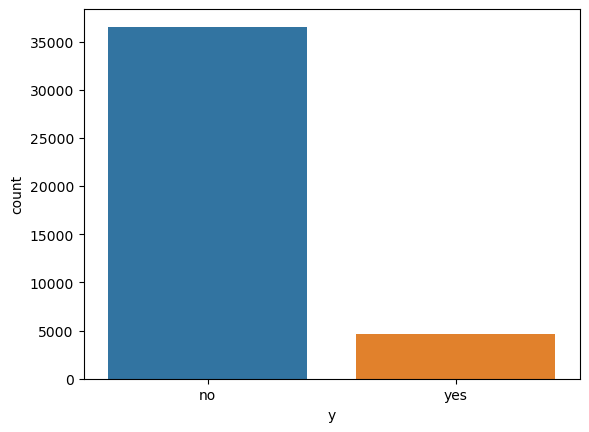

In [46]:
sns.countplot(df2, x='y')

In [47]:
X = df2.iloc[:,0:47]
y = df2['y']

<div class='alert alert-success'>
Precisamos padronizar o modelo pois as features estão em escalas diferentes.
    Fazemos isso com o uso do Standard Scaler que é um padronizador que remove
    a média e dimensionando para a variância unitária.
    Fazendo isso ele transforma cada valor dos dados de forma que a média dos dados
    padronizados seja zero e o desvio padrão seja igual a um.
</div>

In [48]:
std = StandardScaler()
scaled_X = pd.DataFrame(std.fit_transform(X), columns=X.columns)

In [49]:
scaled_X

,age,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,job_admin.,...,housing_unknown,housing_yes,loan_no,loan_unknown,loan_yes,contact_cellular,contact_telephone,poutcome_failure,poutcome_nonexistent,poutcome_success
0,1.533034,-0.565922,0.195414,-0.349494,0.648092,0.722722,0.960337,0.712460,0.331680,-0.582023,...,-0.156933,-1.048877,0.461731,-0.156933,-0.422872,-1.31827,1.31827,-0.339290,0.397706,-0.1857
1,1.628993,-0.565922,0.195414,-0.349494,0.648092,0.722722,0.960337,0.712460,0.331680,-0.582023,...,-0.156933,-1.048877,0.461731,-0.156933,-0.422872,-1.31827,1.31827,-0.339290,0.397706,-0.1857
2,-0.290186,-0.565922,0.195414,-0.349494,0.648092,0.722722,0.960337,0.712460,0.331680,-0.582023,...,-0.156933,0.953401,0.461731,-0.156933,-0.422872,-1.31827,1.31827,-0.339290,0.397706,-0.1857
3,-0.002309,-0.565922,0.195414,-0.349494,0.648092,0.722722,0.960337,0.712460,0.331680,1.718146,...,-0.156933,-1.048877,0.461731,-0.156933,-0.422872,-1.31827,1.31827,-0.339290,0.397706,-0.1857
4,1.533034,-0.565922,0.195414,-0.349494,0.648092,0.722722,0.960337,0.712460,0.331680,-0.582023,...,-0.156933,-1.048877,-2.165761,-0.156933,2.364781,-1.31827,1.31827,-0.339290,0.397706,-0.1857
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,3.164336,-0.565922,0.195414,-0.349494,-0.752343,2.058168,-2.292099,-1.495186,-2.815697,-0.582023,...,-0.156933,0.953401,0.461731,-0.156933,-0.422872,0.75857,-0.75857,-0.339290,0.397706,-0.1857
41184,0.573445,-0.565922,0.195414,-0.349494,-0.752343,2.058168,-2.292099,-1.495186,-2.815697,-0.582023,...,-0.156933,-1.048877,0.461731,-0.156933,-0.422872,0.75857,-0.75857,-0.339290,0.397706,-0.1857
41185,1.533034,-0.204909,0.195414,-0.349494,-0.752343,2.058168,-2.292099,-1.495186,-2.815697,-0.582023,...,-0.156933,0.953401,0.461731,-0.156933,-0.422872,0.75857,-0.75857,-0.339290,0.397706,-0.1857
41186,0.381527,-0.565922,0.195414,-0.349494,-0.752343,2.058168,-2.292099,-1.495186,-2.815697,-0.582023,...,-0.156933,-1.048877,0.461731,-0.156933,-0.422872,0.75857,-0.75857,-0.339290,0.397706,-0.1857


In [50]:
scaled_X.shape

(41188, 47)

In [51]:
y.shape

(41188,)

<div class='alert alert-success'>
Abaixo temos alguns valores faltantes, então implemento o KNN imputer que faz a reposição desses valores baseado na distância euclidiana dos "vizinhos próximos".
</div>

In [16]:
impute = KNNImputer(missing_values=np.nan,n_neighbors=10)

In [52]:
df2.isnull().sum()

age                                0
campaign                           0
pdays                              0
previous                           0
emp.var.rate                       0
cons.price.idx                     0
cons.conf.idx                    447
euribor3m                          0
nr.employed                        0
job_admin.                         0
job_blue-collar                    0
job_entrepreneur                   0
job_housemaid                      0
job_management                     0
job_retired                        0
job_self-employed                  0
job_services                       0
job_student                        0
job_technician                     0
job_unemployed                     0
job_unknown                        0
marital_divorced                   0
marital_married                    0
marital_single                     0
marital_unknown                    0
education_basic.4y                 0
education_basic.6y                 0
e

In [53]:
scaled_X[['cons.conf.idx']] = impute.fit_transform(X[['cons.conf.idx']])
scaled_X.isnull().sum()

age                              0
campaign                         0
pdays                            0
previous                         0
emp.var.rate                     0
cons.price.idx                   0
cons.conf.idx                    0
euribor3m                        0
nr.employed                      0
job_admin.                       0
job_blue-collar                  0
job_entrepreneur                 0
job_housemaid                    0
job_management                   0
job_retired                      0
job_self-employed                0
job_services                     0
job_student                      0
job_technician                   0
job_unemployed                   0
job_unknown                      0
marital_divorced                 0
marital_married                  0
marital_single                   0
marital_unknown                  0
education_basic.4y               0
education_basic.6y               0
education_basic.9y               0
education_high.schoo

In [54]:
X_train, X_test, y_train, y_test = train_test_split(scaled_X, y, test_size=0.25, random_state=42)

<div class='alert alert-success'>
Aqui balanceamos nossa feature target.
</div>

In [55]:
smote = SMOTE(random_state=42, k_neighbors=10)
X_train, y_train = smote.fit_resample(scaled_X, y)

In [56]:
y_train.value_counts()

y
no     36548
yes    36548
Name: count, dtype: int64

In [57]:
y_test.value_counts()

y
no     9144
yes    1153
Name: count, dtype: int64

In [58]:
def reportmodel(model,i):
    model.fit(X_train,y_train)
    sp = ShuffleSplit(n_splits=i, test_size=0.2, random_state=42)
    score = cross_val_score(model, X_train,y_train, cv=sp, scoring='accuracy')
    print('Score com ',i, 'folds:', score, '\n', 'Média: ',score.mean(), '\n','Desvio padrao:', score.std())
    print('\n')
    pred = model.predict(X_test)
    print(classification_report(y_test, pred))
    print('\n')
    RocCurveDisplay.from_estimator(model,X_test,y_test)
    print('\n')
    cm = confusion_matrix(y_test,pred)
    cmd = ConfusionMatrixDisplay(cm)
    cmd.plot()
    plt.show()

<div class='alert alert-info'>
O Cross validation se torna importante dando uma indicação antecipada do desempenho do modelo em dados "invisíveis", permitindo que você ajuste o modelo antes do teste. No entanto, o uso contínuo pode levar ao overfitting do conjunto de validação.
Este método divide os dados em vários subconjuntos e roda as fases de treinamento e validação, fornecendo uma estivativa mais robusta e confiável do quão bem o modelo irá se comportar em novos dados.
</div>

<div class='alert alert-success'>
LGBM:
    O Light GBM pode manipular vários tipos de dados, incluindo categóricos, numéricos e texto. Ele também inclui recursos integrados para pré-processamento de dados, validação cruzada e ajuste de hiperparâmetros, facilitando para os usuários otimizarem seus modelos.
</div>

In [ ]:
# lgbm = LGBMClassifier()

In [60]:
lgbm = LGBMClassifier()
param_grid_lgbm = {'boosting_type':['gbdt','dart'],'learning_rate':[0.1,0.5,0.8],
                   'max_depth': [0,5,15], 'n_estimators':[100,300,500],'max_bin': [100,500,1000]}
gs_lgbm = GridSearchCV(lgbm, param_grid_lgbm, verbose=2,n_jobs=-1)

gs_lgbm.fit(X_train,y_train)

Fitting 5 folds for each of 162 candidates, totalling 810 fits
[CV] END boosting_type=gbdt, learning_rate=0.1, max_bin=100, max_depth=0, n_estimators=300; total time=   3.9s
[CV] END boosting_type=gbdt, learning_rate=0.1, max_bin=100, max_depth=0, n_estimators=500; total time=   5.4s
[CV] END boosting_type=gbdt, learning_rate=0.1, max_bin=100, max_depth=5, n_estimators=500; total time=   5.5s
[CV] END boosting_type=gbdt, learning_rate=0.1, max_bin=100, max_depth=15, n_estimators=300; total time=   4.3s
[CV] END boosting_type=gbdt, learning_rate=0.1, max_bin=100, max_depth=15, n_estimators=500; total time=   5.8s
[CV] END boosting_type=gbdt, learning_rate=0.1, max_bin=500, max_depth=0, n_estimators=500; total time=  13.1s
[CV] END boosting_type=gbdt, learning_rate=0.1, max_bin=500, max_depth=5, n_estimators=500; total time=   8.5s
[CV] END boosting_type=gbdt, learning_rate=0.1, max_bin=500, max_depth=15, n_estimators=300; total time=   6.7s
[CV] END boosting_type=gbdt, learning_rate=0.1

GridSearchCV(estimator=LGBMClassifier(), n_jobs=-1,
             param_grid={'boosting_type': ['gbdt', 'dart'],
                         'learning_rate': [0.1, 0.5, 0.8],
                         'max_bin': [100, 500, 1000], 'max_depth': [0, 5, 15],
                         'n_estimators': [100, 300, 500]},
             verbose=2)

In [61]:
gs_lgbm.best_params_

{'boosting_type': 'dart',
 'learning_rate': 0.8,
 'max_bin': 1000,
 'max_depth': 15,
 'n_estimators': 300}

In [184]:
lgbm = LGBMClassifier(boosting_type='dart', learning_rate=0.8, max_depth=15, max_bin=1000, n_estimators=300)
lgbm.fit(X_train,y_train)

LGBMClassifier(boosting_type='dart', learning_rate=0.8, max_bin=1000,
               max_depth=15, n_estimators=300)

Score com  5 folds: [0.93344733 0.93556772 0.9372777  0.9370041  0.93679891] 
 Média:  0.9360191518467851 
 Desvio padrao: 0.0014128088695254774


              precision    recall  f1-score   support

          no       0.95      0.99      0.97      9144
         yes       0.88      0.55      0.67      1153

    accuracy                           0.94     10297
   macro avg       0.91      0.77      0.82     10297
weighted avg       0.94      0.94      0.93     10297







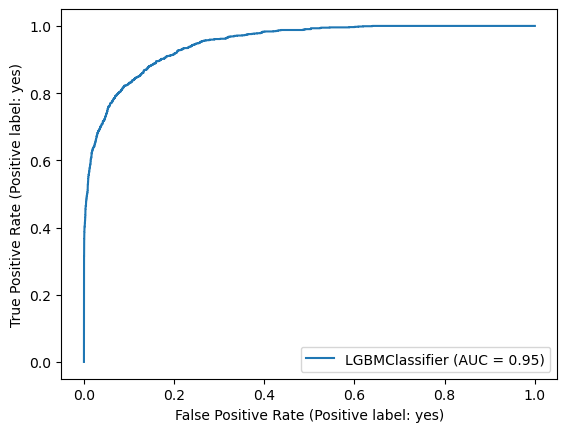

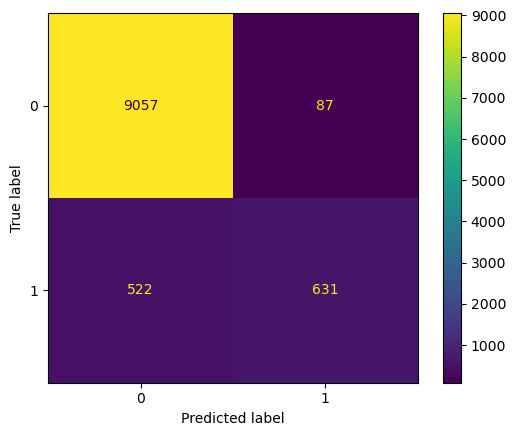

In [185]:
reportmodel(lgbm,5)

Score com  10 folds: [0.93344733 0.93556772 0.9372777  0.9370041  0.93679891 0.94069767
 0.9378249  0.93905609 0.9372777  0.93878249] 
 Média:  0.9373734610123119 
 Desvio padrao: 0.001876988666132876


              precision    recall  f1-score   support

          no       0.95      0.99      0.97      9144
         yes       0.88      0.55      0.67      1153

    accuracy                           0.94     10297
   macro avg       0.91      0.77      0.82     10297
weighted avg       0.94      0.94      0.93     10297







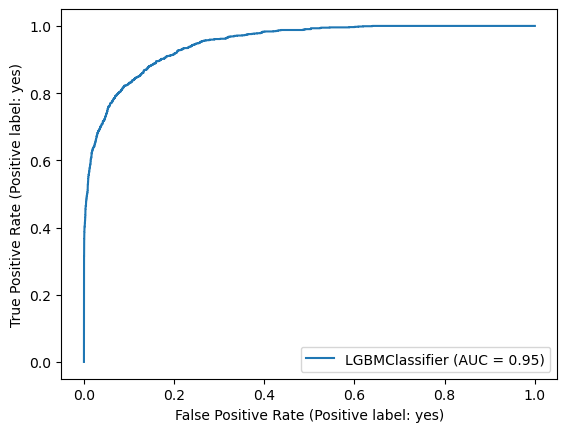

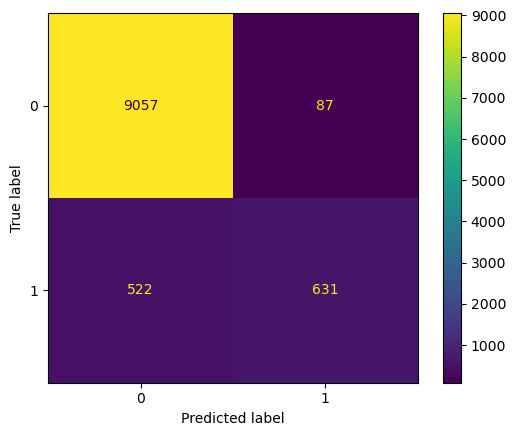

In [186]:
reportmodel(lgbm,10)

<div class='alert alert-success'>
CATBOOST:
Usa árvores de decisão binárias como preditores base. Durante o treinamento, ele cria um conjunto de árvores de decisão continuamente. Cada árvore seguinte é construída reduzindo o loss comparado com as anteriores.
</div>

In [70]:
#cat = CatBoostClassifier()
# param_grid_cat = {'depth':[6,8,10],'learning_rate':[0.01,0.02,0.03,0.05], 'iterations':[100,200,300],
#                   'eval_metric':['Accuracy'],'l2_leaf_reg':[3,5,9]}
# grid_search_cat = GridSearchCV(cat, param_grid_cat,verbose=2, n_jobs=-1, cv=5)
# grid_search_cat.fit(X_train, y_train)

In [69]:
grid_search_cat.best_params_

{'depth': 10,
 'eval_metric': 'Accuracy',
 'iterations': 300,
 'l2_leaf_reg': 3,
 'learning_rate': 0.05}

In [187]:
cat = CatBoostClassifier(depth=10, eval_metric='Accuracy',iterations=300, l2_leaf_reg=3, learning_rate=0.05)
cat.fit(X_train,y_train)

0:	learn: 0.8246416	total: 88ms	remaining: 26.3s
1:	learn: 0.8441775	total: 163ms	remaining: 24.3s
2:	learn: 0.8388284	total: 247ms	remaining: 24.4s
3:	learn: 0.8414004	total: 327ms	remaining: 24.2s
4:	learn: 0.8448752	total: 402ms	remaining: 23.7s
5:	learn: 0.8509905	total: 478ms	remaining: 23.4s
6:	learn: 0.8492804	total: 561ms	remaining: 23.5s
7:	learn: 0.8622633	total: 640ms	remaining: 23.3s
8:	learn: 0.8657929	total: 715ms	remaining: 23.1s
9:	learn: 0.8623317	total: 800ms	remaining: 23.2s
10:	learn: 0.8622086	total: 879ms	remaining: 23.1s
11:	learn: 0.8710053	total: 961ms	remaining: 23.1s
12:	learn: 0.8714841	total: 1.05s	remaining: 23.1s
13:	learn: 0.8711147	total: 1.13s	remaining: 23.1s
14:	learn: 0.8778045	total: 1.22s	remaining: 23.1s
15:	learn: 0.8827432	total: 1.3s	remaining: 23.1s
16:	learn: 0.8917861	total: 1.38s	remaining: 23s
17:	learn: 0.8934689	total: 1.46s	remaining: 22.8s
18:	learn: 0.8956441	total: 1.53s	remaining: 22.7s
19:	learn: 0.8962324	total: 1.61s	remaining: 

0:	learn: 0.8246416	total: 223ms	remaining: 1m 6s
1:	learn: 0.8441775	total: 413ms	remaining: 1m 1s
2:	learn: 0.8388284	total: 575ms	remaining: 56.9s
3:	learn: 0.8414004	total: 721ms	remaining: 53.3s
4:	learn: 0.8448752	total: 870ms	remaining: 51.4s
5:	learn: 0.8509905	total: 1s	remaining: 49.3s
6:	learn: 0.8492804	total: 1.16s	remaining: 48.6s
7:	learn: 0.8622633	total: 1.37s	remaining: 50.1s
8:	learn: 0.8657929	total: 1.53s	remaining: 49.6s
9:	learn: 0.8623317	total: 1.66s	remaining: 48s
10:	learn: 0.8622086	total: 1.81s	remaining: 47.6s
11:	learn: 0.8710053	total: 1.93s	remaining: 46.3s
12:	learn: 0.8714841	total: 2.05s	remaining: 45.3s
13:	learn: 0.8711147	total: 2.18s	remaining: 44.5s
14:	learn: 0.8778045	total: 2.31s	remaining: 43.9s
15:	learn: 0.8827432	total: 2.42s	remaining: 42.9s
16:	learn: 0.8917861	total: 2.55s	remaining: 42.5s
17:	learn: 0.8934689	total: 2.66s	remaining: 41.7s
18:	learn: 0.8956441	total: 2.79s	remaining: 41.3s
19:	learn: 0.8962324	total: 2.91s	remaining: 4

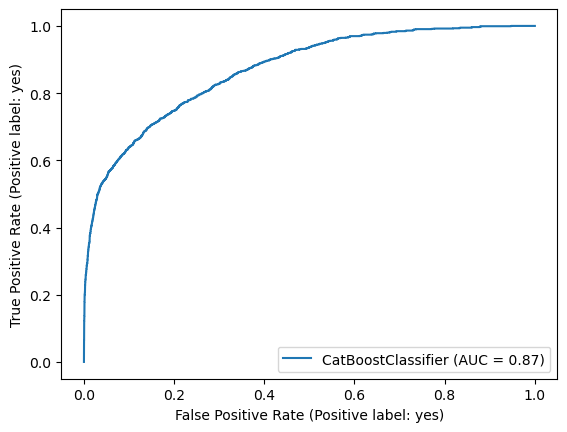

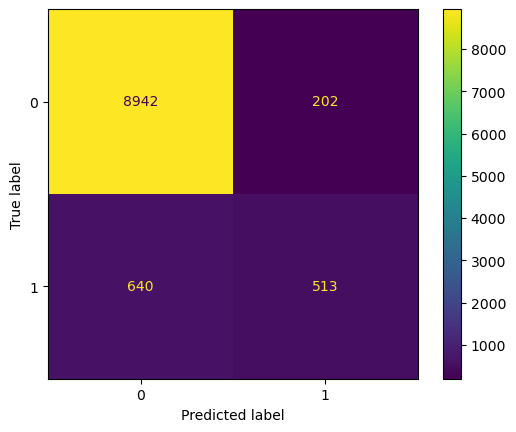

In [188]:
reportmodel(cat,5)

0:	learn: 0.8246416	total: 79.9ms	remaining: 23.9s
1:	learn: 0.8441775	total: 164ms	remaining: 24.5s
2:	learn: 0.8388284	total: 244ms	remaining: 24.1s
3:	learn: 0.8414004	total: 331ms	remaining: 24.5s
4:	learn: 0.8448752	total: 410ms	remaining: 24.2s
5:	learn: 0.8509905	total: 489ms	remaining: 24s
6:	learn: 0.8492804	total: 578ms	remaining: 24.2s
7:	learn: 0.8622633	total: 657ms	remaining: 24s
8:	learn: 0.8657929	total: 735ms	remaining: 23.8s
9:	learn: 0.8623317	total: 820ms	remaining: 23.8s
10:	learn: 0.8622086	total: 898ms	remaining: 23.6s
11:	learn: 0.8710053	total: 976ms	remaining: 23.4s
12:	learn: 0.8714841	total: 1.06s	remaining: 23.4s
13:	learn: 0.8711147	total: 1.15s	remaining: 23.4s
14:	learn: 0.8778045	total: 1.24s	remaining: 23.5s
15:	learn: 0.8827432	total: 1.33s	remaining: 23.7s
16:	learn: 0.8917861	total: 1.41s	remaining: 23.5s
17:	learn: 0.8934689	total: 1.49s	remaining: 23.3s
18:	learn: 0.8956441	total: 1.58s	remaining: 23.4s
19:	learn: 0.8962324	total: 1.66s	remaining:

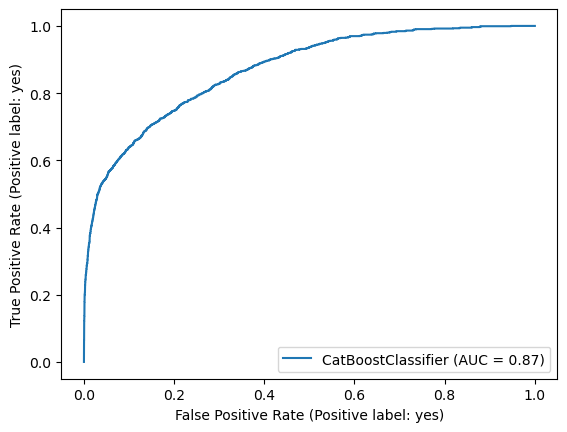

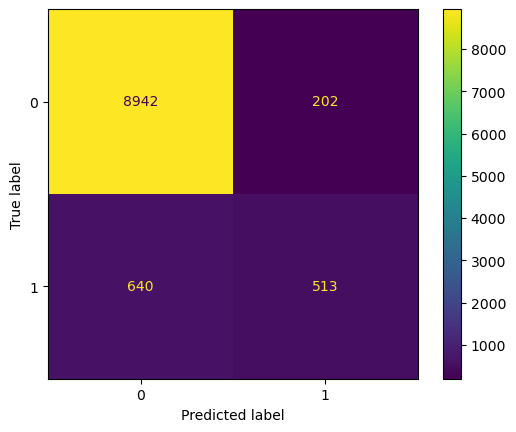

In [189]:
reportmodel(cat,10)

<div class='alert alert-success'>
   MLPCLASSIFIER:
    Um classificador de Redes Neurais.
</div>

In [192]:
X_test.shape,y_test.shape

((10297, 47), (10297,))

In [190]:
(47+1)/2

24.0

In [194]:
# mlpc = MLPClassifier()
# param_grid_mlpc = {'hidden_layer_sizes':[24,],'activation':['identity','relu'],'solver':['adam','sgd'],
#                    'max_iter':[500,1000],'learning_rate_init':[0.001,0.005,0.008]}
# grid_search_mlpc = GridSearchCV(mlpc,param_grid_mlpc,verbose=2,n_jobs=-1)

# grid_search_mlpc.fit(X_train,y_train)

Fitting 5 folds for each of 24 candidates, totalling 120 fits


GridSearchCV(estimator=MLPClassifier(), n_jobs=-1,
             param_grid={'activation': ['identity', 'relu'],
                         'hidden_layer_sizes': [24],
                         'learning_rate_init': [0.001, 0.005, 0.008],
                         'max_iter': [500, 1000], 'solver': ['adam', 'sgd']},
             verbose=2)

In [195]:
grid_search_mlpc.best_params_

{'activation': 'identity',
 'hidden_layer_sizes': 24,
 'learning_rate_init': 0.005,
 'max_iter': 500,
 'solver': 'sgd'}

In [196]:
mlpc = MLPClassifier(activation='identity', hidden_layer_sizes=24,learning_rate_init=0.005,max_iter=500, solver='sgd')
mlpc.fit(X_train,y_train)

MLPClassifier(activation='identity', hidden_layer_sizes=24,
              learning_rate_init=0.005, max_iter=500, solver='sgd')

In [201]:
y_train.replace(0,'no',inplace=True)
y_train.replace(1,'yes',inplace=True)

Score com  5 folds: [0.7250342  0.72257182 0.72161423 0.73625171 0.73132695] 
 Média:  0.727359781121751 
 Desvio padrao: 0.005588365059014729


              precision    recall  f1-score   support

          no       0.94      0.84      0.89      9144
         yes       0.32      0.61      0.42      1153

    accuracy                           0.81     10297
   macro avg       0.63      0.72      0.65     10297
weighted avg       0.87      0.81      0.83     10297







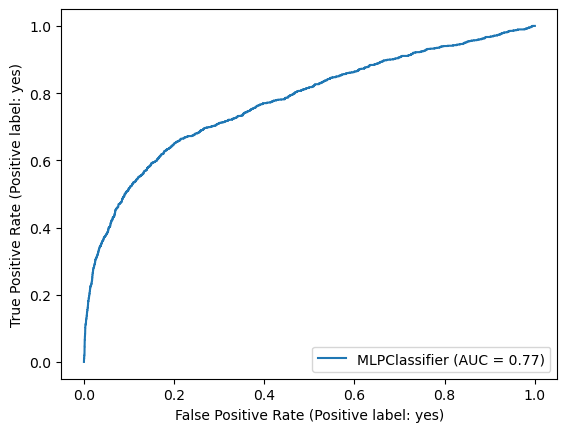

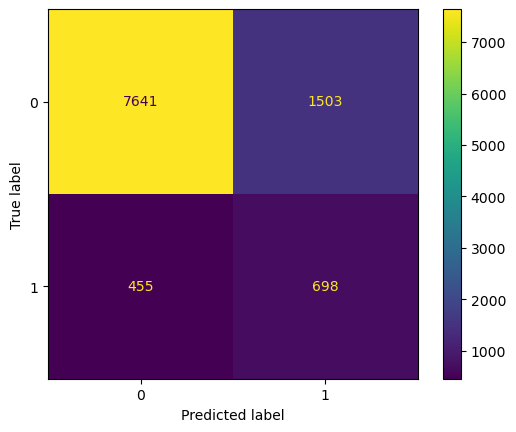

In [202]:
reportmodel(mlpc,5)

Score com  10 folds: [0.73023256 0.73399453 0.73495212 0.72777018 0.7250342  0.74138167
 0.73686731 0.7376881  0.73303694 0.73584131] 
 Média:  0.7336798905608755 
 Desvio padrao: 0.004624956347630925


              precision    recall  f1-score   support

          no       0.95      0.82      0.88      9144
         yes       0.31      0.63      0.41      1153

    accuracy                           0.80     10297
   macro avg       0.63      0.73      0.65     10297
weighted avg       0.87      0.80      0.83     10297







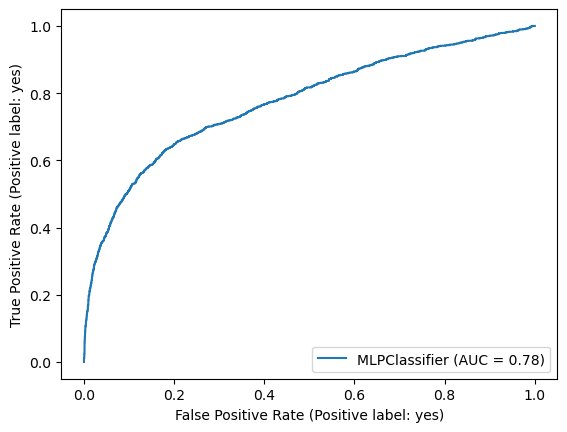

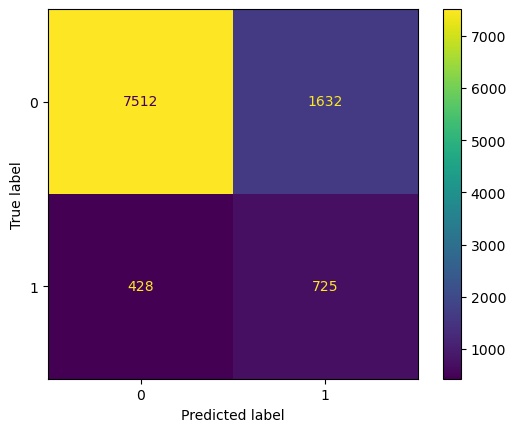

In [203]:
reportmodel(mlpc,10)

In [204]:
lgbm.fit(X,y)
pred_lgbm = lgbm.predict(X)

In [205]:
target = pd.DataFrame(pred_lgbm,columns=['Term_deposit'])
target

,Term_deposit
0,no
1,no
2,no
3,no
4,no
...,...
41183,yes
41184,yes
41185,no
41186,yes


In [207]:
target['Term_deposit'].value_counts()

Term_deposit
no     38927
yes     2261
Name: count, dtype: int64

<div class='alert alert-success'>
RESPONDENDO AS QUESTÕES DE NEGÓCIO
</div>

##### 1 - SEGMENTO DA POPULAÇÃO:

- ESTUDANTES DO ENSINO MÉDIO E FACULDADE;
- PARA AS PESSOAS CADASTRADAS COMO CASADAS E SOLTEIRAS;
- AS CAMPANHAS PODEM SER POTENCIALIZADAS NOS MESES DE MAIO À SETEMBRO;
- PARA OS CADASTRADOS COMO ADMINISTRADORES, AUTÔNOMOS, GERENTES, EMPREENDEDORES E TÉCNICOS;

##### 2 - CANAIS DE DISTRIBUIÇÃO

- CELULAR COMO PRINCIPAL E PODEM SER FEITAS TENTATIVAS POR TELEFONE, SEGUNDO ESTE DATASET,
  EXISTEM DIVERSAS OUTRAS FORMAS.

##### 3 - OS CLIENTES EM POTENCIAL PODEM SER OBSERVADOS NO TARGET DO MODELO FINAL.

##### 4 - ESTRATÉGIAS PROMOCIONAIS

- ANÚNCIOS PATROCINADOS: Google Ads, Facebook Ads e Instagram para atingir públicos segmentados;
- INFLUENCIADORES FINANCEIROS: Parceria com influenciadores;
- MARKETING DE CONTEÚDO: Criar blogs, vídeos e conteúdo sobre educação financeira.
- INDIQUE E GANHE;
- PARCERIAS ESTRATÉGICAS: Benefícios para clientes que utilizam serviços de empresas parceiras(descontos, milhas...)
- ATENDIMENTO OMNICHANNEL: Disponibilizar suporte via Whatsapp, chatbot e atendimento humano;
- ISENÇÃO DE TAXAS;
- CASHBACK E RECOMPENSAS;
- TAXAS DIFERENCIADAS.